In [3]:
from openai import AzureOpenAI
import os
import requests
from PIL import Image
import json

# Assign the API version (DALL-E is currently supported for the 2023-06-01-preview API version only)
from dotenv import load_dotenv

load_dotenv()

client = AzureOpenAI(
    azure_endpoint = os.environ["AZURE_OPENAI_ENDPOINT"],
    api_key = os.environ["AZURE_OPENAI_API_KEY"],
    api_version = "2024-02-15-preview",
  )

print(os.environ["AZURE_OPENAI_ENDPOINT"],)

https://haxudalle.openai.azure.com/


In [17]:

model = os.environ["AZURE_OPENAI_DALL_E_MODEL"],

disallow_list = "swords, violence, blood, gore, nudity, sexual content, adult content, adult themes, adult language, adult humor, adult jokes, adult situations, adult"

meta_prompt = f"""You are an assistant designer that creates images for children. 

The image needs to be safe for work and appropriate for children. 

The image needs to be in color.  

The image needs to be in landscape orientation.  

The image needs to be in a 16:9 aspect ratio. 

Do not consider any input from the following that is not safe for work or appropriate for children. 
{disallow_list}"""

prompt = f"""{meta_prompt}
Generate monument of the Arc of Triumph in Paris, France, in the evening light with a small child holding a Teddy looks on.
"""


try:
    # Create an image by using the image generation API

    result = client.images.generate(
        model=model,
        prompt=prompt,    # Enter your prompt text here
        size='1024x1024',
        n=1
    )

    generation_response = json.loads(result.model_dump_json())
    # Set the directory for the stored image
    image_dir = os.path.join(os.curdir, 'images')

    # If the directory doesn't exist, create it
    if not os.path.isdir(image_dir):
        os.mkdir(image_dir)

    # Initialize the image path (note the filetype should be png)
    image_path = os.path.join(image_dir, 'ch9-sol-generated-image.png')

    # Retrieve the generated image
    image_url = generation_response["data"][0]["url"]  # extract image URL from response
    generated_image = requests.get(image_url).content  # download the image
    with open(image_path, "wb") as image_file:
        image_file.write(generated_image)

    # Display the image in the default image viewer
    image = Image.open(image_path)
    image.show()

# catch exceptions
#except client.error.InvalidRequestError as err:
#    print(err)

finally:
    print("completed!")
# ---creating variation below---



# response = openai.Image.create_variation(
#   image=open(image_path, "rb"),
#   n=1,
#   size="1024x1024"
# )

# image_path = os.path.join(image_dir, 'generated_variation.png')

# image_url = response['data'][0]['url']

# generated_image = requests.get(image_url).content  # download the image
# with open(image_path, "wb") as image_file:
#     image_file.write(generated_image)

# # Display the image in the default image viewer
# image = Image.open(image_path)
# image.show()

completed!


NotFoundError: Error code: 404 - {'error': {'code': 'DeploymentNotFound', 'message': 'The API deployment for this resource does not exist. If you created the deployment within the last 5 minutes, please wait a moment and try again.'}}

In [18]:
from openai import AzureOpenAI
import os
import requests
from PIL import Image
import json

# Assign the API version (DALL-E is currently supported for the 2023-06-01-preview API version only)
from dotenv import load_dotenv

client = AzureOpenAI(
    azure_endpoint = "",
    api_key = "",
    api_version = "2024-02-15-preview",
  )


In [4]:
# set a directory to save DALL·E images to
image_dir_name = "images"
image_dir = os.path.join(os.curdir, image_dir_name)

# create the directory if it doesn't yet exist
if not os.path.isdir(image_dir):
    os.mkdir(image_dir)

# print the directory to save to
print(f"{image_dir=}")


image_dir='.\\images'


In [5]:
# create an image

# set the prompt
prompt = "A cyberpunk monkey hacker dreaming of a beautiful bunch of bananas, digital art"

# call the OpenAI API
result = client.images.generate(
    model="dall-e-3",
    prompt=prompt,
    n=1,
    size="1024x1024",
    response_format="url",
)

# print response
print(result)


ImagesResponse(created=1712155981, data=[Image(b64_json=None, revised_prompt='An anthropoid primate, from the family of monkeys, engrossed in a cybernetic world of glowing neon lights and towering structures. The primate has a smoky black fur and golden eyes that are illuminated by the screen of a hi-tech holographic computer, located in a dimly lit, grungy room characteristic of a cyberpunk environment. It is hacking away with dexterity, visible through the nimble movements of its fingers on the holographic keyboard. The room is littered with digital screens, displaying complex code and data streams. A dream bubble hovers above its head, depicting a vivid and substantial bunch of ripe, yellow bananas. The scene encapsulates the fusion of wild nature with advanced technology, presenting a wistful longing typical of cyberpunk aesthetics.', url='https://dalleprodsec.blob.core.windows.net/private/images/19e20a85-27c9-4538-8736-f798a5b1e21a/generated_00.png?se=2024-04-04T14%3A53%3A14Z&sig=

In [6]:
generation_response = json.loads(result.model_dump_json())
# Set the directory for the stored image
image_dir = os.path.join(os.curdir, 'images')

# If the directory doesn't exist, create it
if not os.path.isdir(image_dir):
    os.mkdir(image_dir)

# Initialize the image path (note the filetype should be png)
image_path = os.path.join(image_dir, 'ch9-sol-generated-image.png')

# Retrieve the generated image
image_url = generation_response["data"][0]["url"]  # extract image URL from response
generated_image = requests.get(image_url).content  # download the image
with open(image_path, "wb") as image_file:
    image_file.write(generated_image)


In [7]:
image = Image.open(image_path)
image.show()

.\images\ch9-sol-generated-image.png


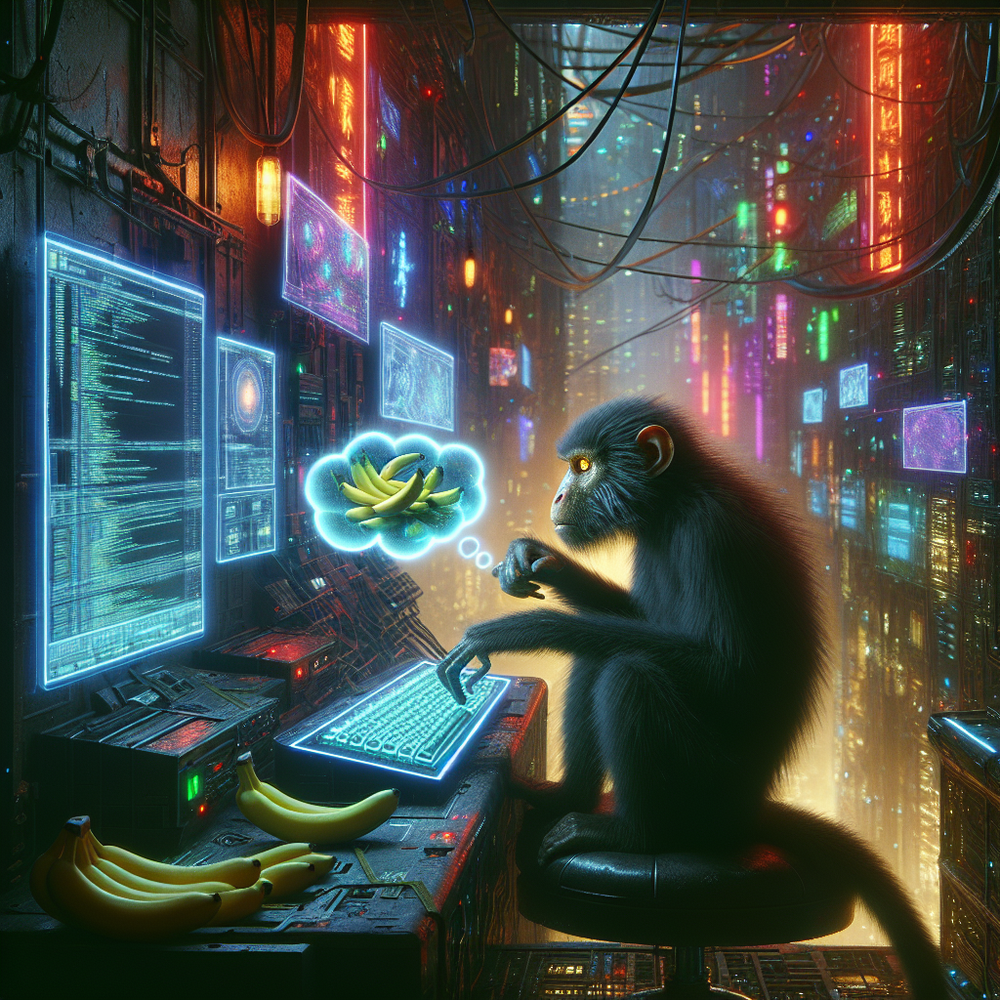

In [8]:
# print the image
print(image_path)
display(Image.open(image_path))


In [13]:
# call the OpenAI API, using `create_variation` rather than `create`
variation_response = client.images.create_variation(
    image=generated_image,  # generated_image is the image generated above
    n=2,
    size="1024x1024",
    response_format="url",
)

# print response
print(variation_response)

NotFoundError: Error code: 404 - {'error': {'code': '404', 'message': 'Resource not found'}}

In [14]:
print(generated_image)

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x04\x00\x00\x00\x04\x00\x08\x02\x00\x00\x00\xf0\x7f\xbc\xd4\x00\x00;\xc8caBX\x00\x00;\xc8jumb\x00\x00\x00\x1ejumdc2pa\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03c2pa\x00\x00\x00;\xa2jumb\x00\x00\x00Gjumdc2ma\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03urn:uuid:8aafd69b-39a1-4883-a58b-3c902705a0f1\x00\x00\x00\r\njumb\x00\x00\x00)jumdc2as\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x03c2pa.assertions\x00\x00\x00\x0c\x12jumb\x00\x00\x00Ajumdcbor\x00\x11\x00\x10\x80\x00\x00\xaa\x008\x9bq\x13c2pa.hash.boxes\x00\x00\x00\x00\x18c2shW\x8c\xbd8\x9bFO\xefo\t+D\\=\t#\x00\x00\x0b\xc9cbor\xa2calgfsha256eboxes\x985\xa3enames\x81dPNGhdhashX LKj;\xe11J\xb8a8\xbe\xf41M\xde\x02.`\t`\xd8h\x9a,\x8f\x861\x80- \xda\xb6cpad@\xa3enames\x81dIHDRdhashX DH8U\x81r\x0c_\xf8#\x99-\x97\xdd\xa6T.\xc1h\xeeF7\xbb\x13\xf0Q\xc2A{\xb6/Kcpad@\xa3enames\x81dC2PAdhashA\x00cpad@\xa3enames\x81dIDATdhashX 7Jye\xe0\x1c\x86Q\x05F\xc8\x17\xc9\xa0\xf2\x8e\xd1w\xb5\xbc\x0b|\xfd@ \x0f\x9

In [15]:
# create a mask
width = 1024
height = 1024
mask = Image.new("RGBA", (width, height), (0, 0, 0, 1))  # create an opaque image mask

# set the bottom half to be transparent
for x in range(width):
    for y in range(height // 2, height):  # only loop over the bottom half of the mask
        # set alpha (A) to zero to turn pixel transparent
        alpha = 0
        mask.putpixel((x, y), (0, 0, 0, alpha))

# save the mask
mask_name = "bottom_half_mask.png"
mask_filepath = os.path.join(image_dir, mask_name)
mask.save(mask_filepath)


In [16]:
# edit an image

# call the OpenAI API
edit_response = client.images.edit(
    image=open(image_path, "rb"),  # from the generation section
    mask=open(mask_filepath, "rb"),  # from right above
    prompt=prompt,  # from the generation section
    n=1,
    size="1024x1024",
    response_format="url",
)

# print response
print(edit_response)

NotFoundError: Error code: 404 - {'error': {'code': '404', 'message': 'Resource not found'}}